#Project Kuler

###Import modules

In [3]:
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import scipy as sp

# plotting
import seaborn as sns
sns.set(style="whitegrid")
import matplotlib.pyplot as plt
import matplotlib.cm as pltcm
%matplotlib inline

# colormath: color conversion and distance calculation
import colormath as cm

##1. Import data

In [4]:
# read_json: convert json into dataframe
df = pd.read_json('kuler_data_new.txt')
df.head()

,access,author,comment,createdAt,description,editedAt,harmony,href,iccProfile,id,like,name,originalTheme,rating,swatches,tags,view
0,{u'visibility': u'public'},"{u'id': u'17923', u'name': u'ps'}",{u'count': 339},2007-01-18T08:51:12+00:00,,2014-12-16T05:24:50+00:00,"{u'baseSwatchIndex': 0, u'sourceURL': u'', u'm...",http://adobe.ly/1BOf1GL,,15325,{u'count': 13707},sandy stone beach ocean diver,0,"{u'count': 1755, u'overall': 3.9}","[{u'hex': u'E6E2AF', u'colorIndex': 598, u'val...","[{u'value': u'beach'}, {u'value': u'diver'}, {...",{u'count': 39612}
1,{u'visibility': u'public'},"{u'id': u'17772', u'name': u'matthepworth'}",{u'count': 186},2007-03-01T00:42:36+00:00,,2007-03-01T00:51:15+00:00,"{u'baseSwatchIndex': 0, u'sourceURL': u'', u'm...",https://kuler.adobe.com/Firenze-color-theme-24...,,24198,{u'count': 10737},Firenze,0,"{u'count': 1441, u'overall': 3.89}","[{u'hex': u'468966', u'colorIndex': 296, u'val...","[{u'value': u'bellagio'}, {u'value': u'boot'},...",{u'count': 28750}
2,{u'visibility': u'public'},"{u'id': u'17772', u'name': u'matthepworth'}",{u'count': 54},2007-02-22T00:06:18+00:00,,2007-02-22T00:06:18+00:00,"{u'baseSwatchIndex': 0, u'sourceURL': u'', u'm...",https://kuler.adobe.com/Neutral-Blue-color-the...,,22361,{u'count': 8993},Neutral Blue,0,"{u'count': 556, u'overall': 3.78}","[{u'hex': u'FCFFF5', u'colorIndex': 1558, u'va...","[{u'value': u'adult'}, {u'value': u'azure'}, {...",{u'count': 18051}
3,{u'visibility': u'public'},"{u'id': u'243670', u'name': u'rockstarflu'}",{u'count': 18},2012-02-14T16:36:28+00:00,,2012-02-14T16:36:28+00:00,"{u'baseSwatchIndex': 1, u'sourceURL': u'', u'm...",https://kuler.adobe.com/Phaedra-color-theme-17...,,1764754,{u'count': 7108},Phaedra,0,"{u'count': 149, u'overall': 4.06}","[{u'hex': u'FF6138', u'colorIndex': 1884, u'va...",[],{u'count': 10185}
4,{u'visibility': u'public'},"{u'id': u'422481', u'name': u'dezi9er'}",{u'count': 50},2011-09-03T16:14:04+00:00,,2011-09-03T16:14:04+00:00,"{u'baseSwatchIndex': 2, u'sourceURL': u'', u'm...",https://kuler.adobe.com/Honey-Pot-color-theme-...,,1490158,{u'count': 6352},Honey Pot,0,"{u'count': 261, u'overall': 4.09}","[{u'hex': u'105B63', u'colorIndex': 781, u'val...","[{u'value': u'bee'}, {u'value': u'bottle'}, {u...",{u'count': 9708}


##2. Clean data

In [5]:
# drop the columns that I am not going to use for now
df = df.drop('access', 1)
df = df.drop('description', 1)
df = df.drop('harmony', 1)
df = df.drop('iccProfile', 1)
df = df.drop('originalTheme', 1)
df = df.drop('editedAt', 1)
df = df.drop('href', 1)

In [6]:
# check the data type
df.apply(lambda x: pd.lib.infer_dtype(x.values))

author         mixed
comment        mixed
createdAt    unicode
id           integer
like           mixed
name         unicode
rating         mixed
swatches       mixed
tags           mixed
view           mixed
dtype: object

- mixed: nested datasets

##3.1. Extract data - preparation

###General methods: use keys

In [7]:
# Ex: author id and name
print int(df['author'][0]["id"])
print str(df['author'][0]["name"])

17923
ps


###Time-series: assign datetime format
- dtype CreateAt is str, we need to convert it to datatime format
- See the example below

In [8]:
# import datetime
from datetime import datetime
df_time_example = df.createdAt[0]
df_time_example = df_time_example[:-6] # I left out +00:00 part
print df_time_example
datetime.strptime(df_time_example, '%Y-%m-%dT%H:%M:%S')

2007-01-18T08:51:12


datetime.datetime(2007, 1, 18, 8, 51, 12)

###Color: "swatches" has all 5 color information in multiple formats.

In [9]:
df.swatches[0]

[{u'colorIndex': 598,
  u'hex': u'E6E2AF',
  u'mode': u'rgb',
  u'name': u'',
  u'values': [0.901961, 0.8862749999999999, 0.686275]},
 {u'colorIndex': 1630,
  u'hex': u'A7A37E',
  u'mode': u'rgb',
  u'name': u'',
  u'values': [0.654902, 0.639216, 0.494118]},
 {u'colorIndex': 594,
  u'hex': u'EFECCA',
  u'mode': u'rgb',
  u'name': u'',
  u'values': [0.937255, 0.92549, 0.792157]},
 {u'colorIndex': 854,
  u'hex': u'046380',
  u'mode': u'rgb',
  u'name': u'',
  u'values': [0.0156863, 0.388235, 0.501961]},
 {u'colorIndex': 1544,
  u'hex': u'002F2F',
  u'mode': u'rgb',
  u'name': u'',
  u'values': [0, 0.18431399999999998, 0.18431399999999998]}]

In [10]:
df.swatches[0][0]

{u'colorIndex': 598,
 u'hex': u'E6E2AF',
 u'mode': u'rgb',
 u'name': u'',
 u'values': [0.901961, 0.8862749999999999, 0.686275]}

- We are going to use the hexcode for convenience

In [11]:
str(df.swatches[0][0]["hex"])

'E6E2AF'

##3.2. Extract data - execution

###Decide which key-value to extract

- Column name - key
    - author - id
    - comment - count
    - like - count
    - rating - count, overall
    - view - count

###Build a function to pass rows to extract values

In [12]:
def func(x,keyname):
    k = x[keyname] # here I read key values 
    return pd.Series(k)

###Extract values using keys (function, apply and lambda)

In [13]:
df['AuthorID']=df['author'].apply((lambda x: func(x,'id')))
df['Comments']=df['comment'].apply((lambda x: func(x,'count')))
df['Likes']=df['like'].apply((lambda x: func(x,'count')))
df['ReviewCounts']=df['rating'].apply((lambda x: func(x,'count')))
df['ReviewAvr']=df['rating'].apply((lambda x: func(x,'overall')))
df['Views']=df['view'].apply((lambda x: func(x,'count')))

In [14]:
# Drop OLD columns
df = df.drop('author', 1)
df = df.drop('comment', 1)
df = df.drop('like', 1)
df = df.drop('rating', 1)
df = df.drop('view', 1)

###Convert time-series (function, apply and lambda)

In [15]:
def convert_time(x):
    k = x[:-6]
    k = datetime.strptime(k, '%Y-%m-%dT%H:%M:%S')
    return pd.Series(k)
df['Time']=df['createdAt'].apply((lambda x: convert_time(x)))
# drop OLD column
df = df.drop('createdAt', 1)

###Extract colors (function, apply and lambda)

- Build a separate column for each color (in order)
- swatches column structure: example -> df.swatches[20][4]["hex"]
    - the first index (20): row number
    - the second index (4): 5th color in the scheme

In [16]:
def func_extract_color(x,colorIdx):
    k = x[colorIdx]["hex"] # here I read key values 
    return pd.Series(k)
df['C1']=df['swatches'].apply((lambda x: func_extract_color(x,0)))
df['C2']=df['swatches'].apply((lambda x: func_extract_color(x,1)))
df['C3']=df['swatches'].apply((lambda x: func_extract_color(x,2)))
df['C4']=df['swatches'].apply((lambda x: func_extract_color(x,3)))
df['C5']=df['swatches'].apply((lambda x: func_extract_color(x,4)))
# drop OLD column
df = df.drop('swatches', 1)

###Rearrange columns

In [17]:
df = df[['id','name','C1','C2','C3','C4','C5','Likes','Time','AuthorID','ReviewCounts','ReviewAvr','Views','Comments','tags']]
df.head()

,id,name,C1,C2,C3,C4,C5,Likes,Time,AuthorID,ReviewCounts,ReviewAvr,Views,Comments,tags
0,15325,sandy stone beach ocean diver,E6E2AF,A7A37E,EFECCA,046380,002F2F,13707,2007-01-18 08:51:12,17923,1755,3.90,39612,339,"[{u'value': u'beach'}, {u'value': u'diver'}, {..."
1,24198,Firenze,468966,FFF0A5,FFB03B,B64926,8E2800,10737,2007-03-01 00:42:36,17772,1441,3.89,28750,186,"[{u'value': u'bellagio'}, {u'value': u'boot'},..."
2,22361,Neutral Blue,FCFFF5,D1DBBD,91AA9D,3E606F,193441,8993,2007-02-22 00:06:18,17772,556,3.78,18051,54,"[{u'value': u'adult'}, {u'value': u'azure'}, {..."
3,1764754,Phaedra,FF6138,FFFF9D,BEEB9F,79BD8F,00A388,7108,2012-02-14 16:36:28,243670,149,4.06,10185,18,[]
4,1490158,Honey Pot,105B63,FFFAD5,FFD34E,DB9E36,BD4932,6352,2011-09-03 16:14:04,422481,261,4.09,9708,50,"[{u'value': u'bee'}, {u'value': u'bottle'}, {u..."


##4. Exploratory Data Analysis (EDA)

###Check the activity of the website

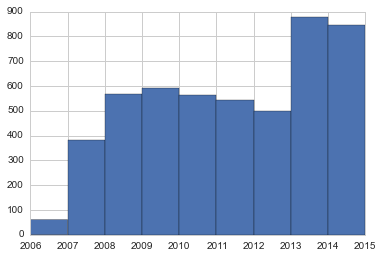

In [18]:
# Extract year
df['Year']=df['Time'].apply((lambda x: x.year))

# Plot histogram of number of themes uploaded in each year
nbins = max(df.Year)-min(df.Year)
fig, ax = plt.subplots()   
ax.hist(df.Year,bins=nbins)
names = range(min(df.Year), max(df.Year)+1)
ax.set_xticklabels(names)

###How to measure preference

####1. Number of reviews vs. average rating 

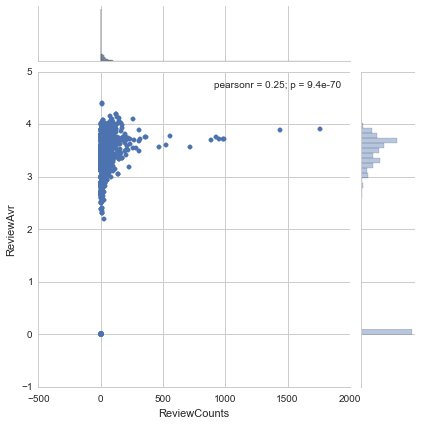

In [19]:
# scatter/hist joint plot
sns.jointplot('ReviewCounts','ReviewAvr',data=df)

- Histogram shows that many themes do not even have reviews.

####2. Number of reviews vs. number of likes

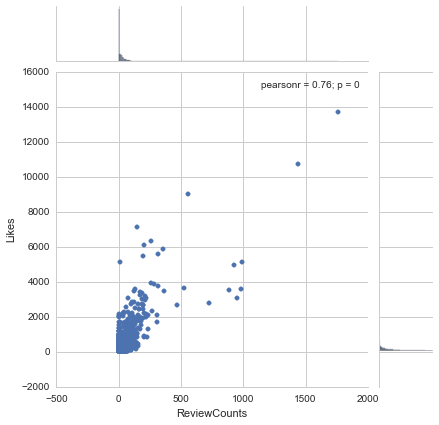

In [20]:
sns.jointplot('ReviewCounts','Likes',data=df)

- Positive correlation, but still many themes don't have reviews.
- Nither review counts nor average rating may not a good measure for preference.

####3. Number of views vs. number of likes

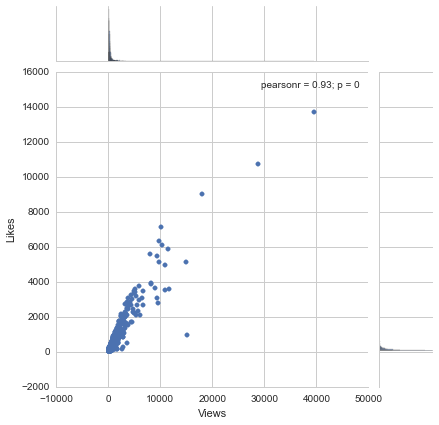

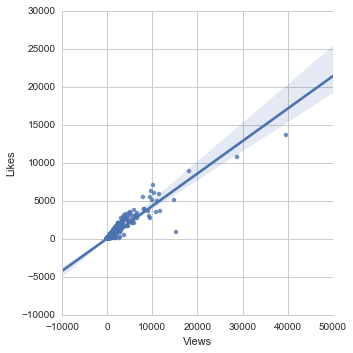

In [21]:
sns.jointplot('Views','Likes',data=df)
# linear regression
sns.lmplot("Views", "Likes", data=df)

- Positive (linear) correlation
- Like is a more active representation of preference than view.
###<font color='blue'>Likes seem to be a good measure of preference</font>

###Likes: distribution

####1. Histogram of number of likes

median Likes: 108.0
mean Likes: 224.492800649
mode Likes: (array([ 86.]), array([ 183.]))


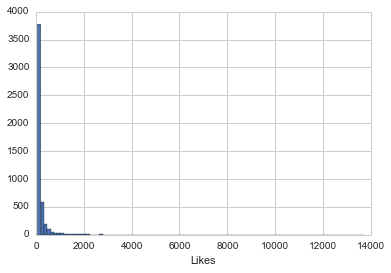

In [22]:
print 'median Likes: '+str(np.median(df.Likes))
print 'mean Likes: '+ str(np.mean(df.Likes))
print 'mode Likes: '+ str(sp.stats.mstats.mode(df.Likes))
plt.hist(df.Likes,bins=100)
plt.xlabel('Likes')

- The distribution has a long tail. Very few are extremely popular.

####2. Average number of likes per year

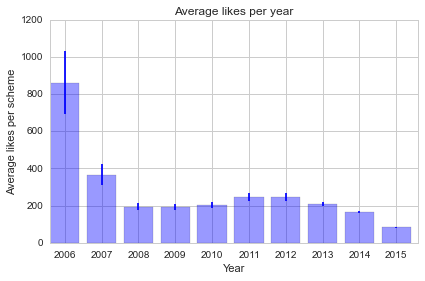

In [23]:
# group df per year
grouped_Year = df.groupby('Year')
# compute the mean of likes for each groupby
grouped_Year.agg(np.mean).Likes
# get year index 
index = np.arange(len(grouped_Year.size()))
# draw figure
bar_width = 0.8
opacity = 0.4
rects = plt.bar(index, grouped_Year.agg(np.mean).Likes, bar_width, 
                alpha=opacity, 
                color='b', 
                yerr=grouped_Year.agg(np.std).Likes/np.sqrt(grouped_Year.size()),
                ecolor='b')
# labels
plt.xlabel('Year')
plt.ylabel('Average likes per scheme')
plt.xticks(index + bar_width/2, sorted(df.Year.unique()))
plt.title('Average likes per year')

plt.tight_layout()
plt.show()

- Except for 2006, the average number of likes does not vary much. 
- Extremely popular ones were uploaded in 2006.

###Visualize colors in 3D space

####1. Convert hexcode to RGB

In [24]:
# hex: hexadecimal code of RGB. Each two digits represent R, G, and B in order (0-255 range)
def hextorgb(hexcode):
    R = int(hexcode[:2],16) # convert hexadecimal to decimal
    G = int(hexcode[2:4],16)
    B = int(hexcode[-2:],16)
    rgbcode = [R,G,B]
    return rgbcode # dtype=list

In [25]:
# generate new columns with RGB codes
for i in range(5):
    df['c'+str(i+1)] = df['C'+str(i+1)].apply((lambda x: hextorgb(x)))

####2. Convert RGB to Lab

- Lab space reflects perceptual distance.
- colormath package is useful for converting colors between various color spaces, and compute distance.

In [26]:
# import colormath
from colormath.color_objects import LabColor, sRGBColor # color format (sRGB, Lab)
from colormath.color_conversions import convert_color

# converting rgb to lab (input: list, output: colormath)
def rgb2lab(inputColor):
    color_rgb = sRGBColor(inputColor[0],inputColor[1],inputColor[2],is_upscaled=True)
    # if you want to use 0,255 range, upscaled=True (default is false)
    color_lab = convert_color(color_rgb, LabColor)
    return color_lab
rgb2lab([1,2,3])

LabColor(lab_l=0.509833512052932,lab_a=-0.12241231401730057,lab_b=-0.47076345243975415)

- We generate a new dataframe (df_) with just colors.

In [27]:
# convert and make a summary column (each column for one coordinate  (L, a, or b), )
df_ = pd.DataFrame() # initialize
for i in range(5):
    df_['Lab'+str(i+1)]=df['c'+str(i+1)].apply((lambda x: rgb2lab(x)))    

In [28]:
# extract either L, a, or b value from Lab colormath format
def get_Lab_value(LabColor,index):
    Lab = LabColor.get_value_tuple()[index] # extract specific value from the colormath format (tuple)
    return Lab

In [29]:
# create separate columns for Lab coordinates per color
for i in range(5):
    df_['L'+str(i+1)]=df_['Lab'+str(i+1)].apply((lambda x: get_Lab_value(x,0)))
    df_['a'+str(i+1)]=df_['Lab'+str(i+1)].apply((lambda x: get_Lab_value(x,1)))
    df_['b'+str(i+1)]=df_['Lab'+str(i+1)].apply((lambda x: get_Lab_value(x,2)))

In [30]:
df_.describe()

,L1,a1,b1,L2,a2,b2,L3,a3,b3,L4,a4,b4,L5,a5,b5
count,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000,4931.000000
mean,46.354289,5.883332,10.278128,58.114289,1.262279,15.185324,66.189697,1.092403,19.084862,62.915973,4.182876,19.838753,55.873838,9.688878,18.045758
std,27.663363,27.209923,27.453080,24.139805,26.245910,28.673466,22.267416,25.515631,28.686625,23.477782,26.462751,28.444059,27.180457,29.402092,28.104215
min,0.000000,-81.292880,-98.362560,0.000000,-86.182949,-89.323066,0.000000,-85.558884,-90.931775,0.000000,-85.092702,-107.670516,0.000000,-86.127506,-107.670516
25%,22.120212,-7.943605,-8.546758,39.205554,-14.302672,-4.658182,51.851988,-13.234434,-0.008561,45.952713,-10.649058,-0.008421,32.919575,-6.663943,-0.086650
50%,43.523636,-0.000283,2.755488,60.333942,-1.820359,9.642454,69.091877,-1.567313,14.747588,66.292682,-0.214513,16.113368,57.014159,0.664191,13.833252
75%,68.904607,13.440261,26.730958,77.362058,11.311405,33.845212,83.816738,8.481479,37.600536,82.441198,16.871208,40.153529,79.263595,30.753409,36.344746
max,99.999985,88.893344,94.098353,99.999985,93.259145,93.531875,99.999985,98.235320,94.477318,99.999985,84.753381,94.287706,99.999985,90.085355,94.477318


- Sanity check: L, a, and b values are all within the right range.

####3. Visualize colors ever used in any theme
- 3D plot: Axes 3D from matplotlib

In [31]:
from mpl_toolkits.mplot3d import Axes3D

In [32]:
# convert colormath format to list
def col_tuple2list(colormath_color):
    # extract values from colormath format
    a = colormath_color.get_value_tuple()[0]
    b = colormath_color.get_value_tuple()[1]
    c = colormath_color.get_value_tuple()[2]
    return [a,b,c]

In [33]:
# conver lab to rgb (range: [0,1])
def lab2rgb(inputColor):
    color_lab = LabColor(inputColor[0],inputColor[1],inputColor[2])
    # convert lab to sRGB
    color_rgb = convert_color(color_lab, sRGBColor)
    # convert the format to ndarray
    [a,b,c] = np.array(col_tuple2list(color_rgb))    
    return [a,b,c]

- create a new dataframe and concatenate all colors

In [34]:
df_all = DataFrame()
df_all['L'] = pd.concat([df_.L1,df_.L2,df_.L3,df_.L4,df_.L5],ignore_index=True)
df_all['a'] = pd.concat([df_.a1,df_.a2,df_.a3,df_.a4,df_.a5],ignore_index=True)
df_all['b'] = pd.concat([df_.b1,df_.b2,df_.b3,df_.b4,df_.b5],ignore_index=True)

- Plot every color in Lab space with its own color
- For assigning colors, RGB code is needed
- For locating in the space, Lab code is needed

In [35]:
# Plot every color in Lab space with its own color
# For assigning colors, RGB code is needed
# For locating in the space, Lab code is needed
# index1, index2 determines viewpoint (elevation and azimuth)
def plot_all_colors_chrm(index1=0,index2=0):
    # index1, index2 for 2D plots, default: 3D view
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
    
    # create a figure
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    
    # loop over the entire dataset
    for i in range(df_all.shape[0]):
        # get coordinates
        L_value = df_all['L'].values[i]
        a_value = df_all['a'].values[i]
        b_value = df_all['b'].values[i]
        
        # get colors for plotting
        color_rgb = lab2rgb([L_value,a_value,b_value])
        r = min(color_rgb[0],1) # why min(X,1)? sometimes converted value is slightly larger than 1 (ex. 1.0000001)
        g = min(color_rgb[1],1) # to fix this, take 1 if the value is larger than 1
        b = min(color_rgb[2],1)

        # scatter takes a 2D ndarray as a color parameter
        color = np.array([[r,g,b],[0,0,0]])

        # plot
        ax.scatter(a_value,b_value,L_value,c=color,alpha=0.5)

    # adjust viewing angle
    ax.view_init(elev=el,azim=az)

    # labeling
    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)
    if type(index1) == str:
        # show view points in title
        ax.set_title('Distribution of all colors (' +index1+ ',' +index2+ ')')
    else:
        ax.set_title('Distribution of all colors')

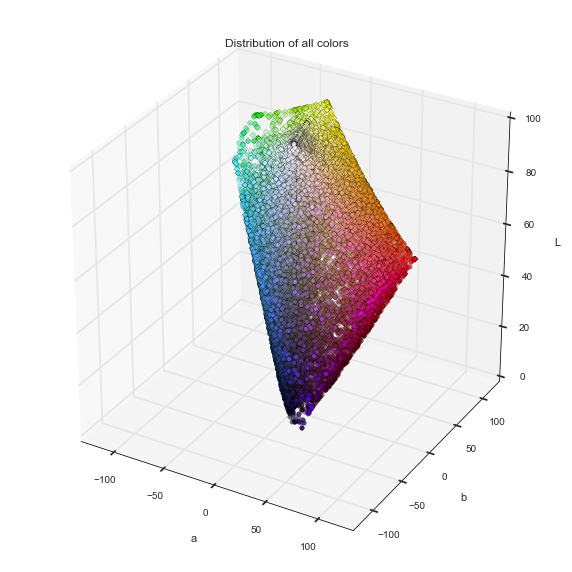

In [36]:
plot_all_colors_chrm()

- Draw 2D plots from different angles to understand the data better

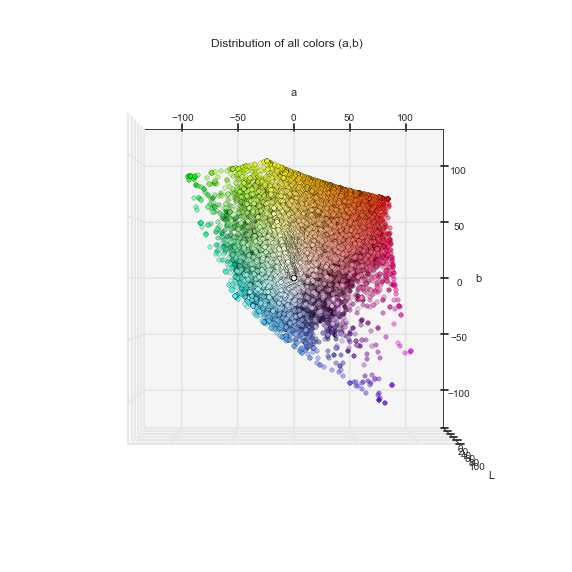

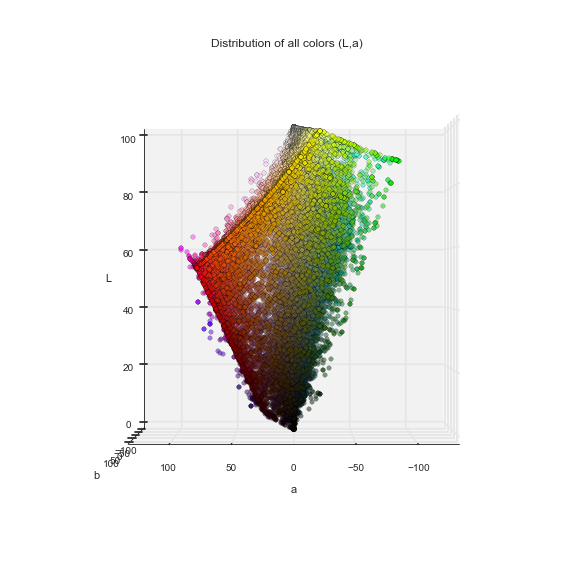

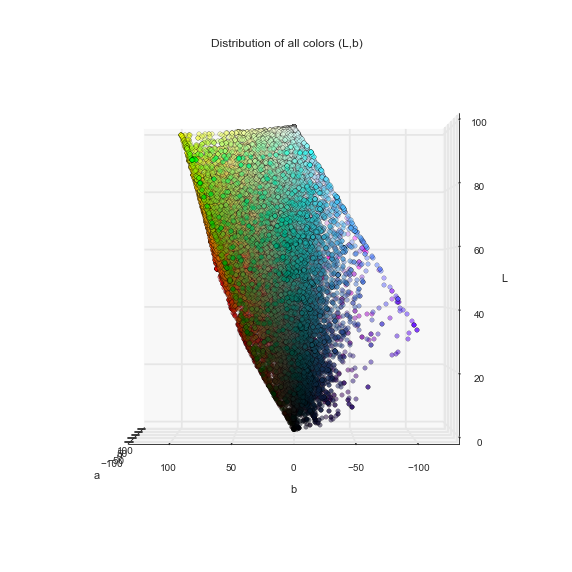

In [37]:
plot_all_colors_chrm('a','b')
plot_all_colors_chrm('L','a')
plot_all_colors_chrm('L','b')

###<font color='blue'>Users seem to avoid certain colors.</font>
- See: https://en.wikipedia.org/wiki/File:Srgb-in-cielab.png

####4. Visualize spatial relationship of colors in a theme

In [38]:
# import color_diff to compute color difference
# Rather than using Eucledian ditance between to dots, we use Delta E 2000 (CIEDE2000)
from colormath import color_diff

- input: theme index (schemeIdx)
- output figure shows...
    - line connection between neighboring colors
    - distance between neighboring colors
    - which color is the first and the last

In [39]:
def plot_scheme(schemeIdx,index1=0,index2=0):
    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
    # draw a figure
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')

    # loop over the colors in a scheme
    for i in range(5):
        # df_ already has cm format(ex. Lab1) and list format (ex. L1, a1...)

        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_['Lab'+str(i+1)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_['L'+str(i+1)][schemeIdx]
        a = df_['a'+str(i+1)][schemeIdx]
        b = df_['b'+str(i+1)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        marker_vec = ['^','o','o','o','v']
        ax.scatter(a,b,L,c=color,s=250,marker=marker_vec[i])
            
        # 5. draw lines between dots
        if i > 0:
            L_prev = df_['L'+str(i)][schemeIdx]
            a_prev = df_['a'+str(i)][schemeIdx]
            b_prev = df_['b'+str(i)][schemeIdx]        
            ax.plot([a_prev,a],[b_prev,b],[L_prev,L],color='black',alpha=0.2)

            # 6. compute distance between dots
            LabColor_cm_prev = LabColor(L_prev,a_prev,b_prev)
            diff = color_diff.delta_e_cie2000(LabColor_cm,LabColor_cm_prev)
            ax.text((a_prev+a)/2,(b_prev+b)/2,(L_prev+L)/2,'%.1f' %diff,(1,0,0))
            
    # view angle
    ax.view_init(elev=el,azim=az)

    # labels
    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)
    # show theme name and number of likes
    ax.set_title('#'+str(schemeIdx)+':'+df.name[schemeIdx]+' ('+str(df.Likes[schemeIdx])+')')

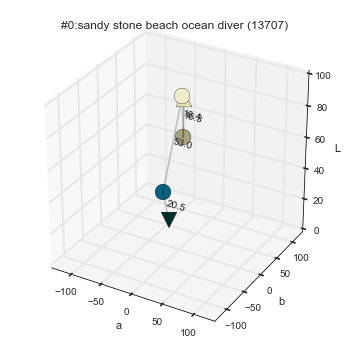

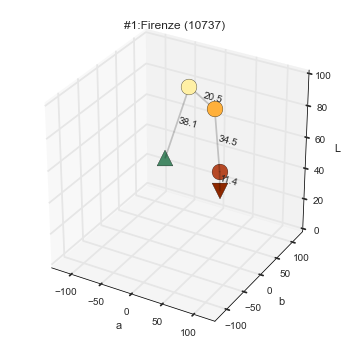

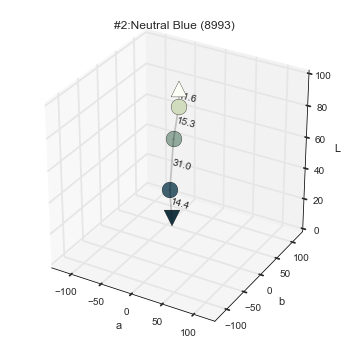

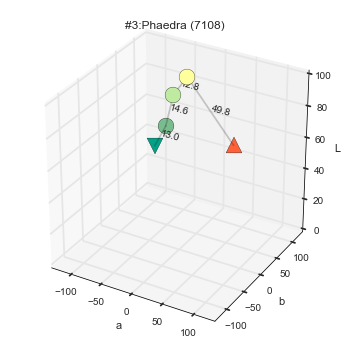

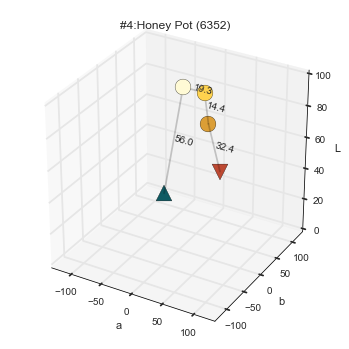

In [40]:
# test: plot the first 5 themes
for i in range(5):
    plot_scheme(i)

##5. Clustering analysis

###Attempt 1: Run a cluster analysis for each theme without considering the absolute colors and order

- I discared this idea because sample size is too small to cluster each theme (n=5).
- For more details, read my blog post: http://www.hongsup.com/blog/2015/6/25/clustering-analysis

###Attempt 2: Using 10D distance vector
- Ignore absolute values

####1. Compute the distance vector

In [41]:
# compute distance for a color theme
def dist_pair(schemeIdx):
    Lab1 = df_.Lab1[schemeIdx]
    Lab2 = df_.Lab2[schemeIdx]
    Lab3 = df_.Lab3[schemeIdx]
    Lab4 = df_.Lab4[schemeIdx]
    Lab5 = df_.Lab5[schemeIdx]
    
    dist_0 = color_diff.delta_e_cie2000(Lab1,Lab2)
    dist_1 = color_diff.delta_e_cie2000(Lab1,Lab3)
    dist_2 = color_diff.delta_e_cie2000(Lab1,Lab4)
    dist_3 = color_diff.delta_e_cie2000(Lab1,Lab5)
    dist_4 = color_diff.delta_e_cie2000(Lab2,Lab3)
    dist_5 = color_diff.delta_e_cie2000(Lab2,Lab4)
    dist_6 = color_diff.delta_e_cie2000(Lab2,Lab5)
    dist_7 = color_diff.delta_e_cie2000(Lab3,Lab4)
    dist_8 = color_diff.delta_e_cie2000(Lab3,Lab5)
    dist_9 = color_diff.delta_e_cie2000(Lab4,Lab5)

    dist_list = [dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,dist_6,dist_7,dist_8,dist_9]
    return dist_list

In [42]:
# generate the 10D vector for all themes
dist_pair_array = []
for i in range(len(df_)):
    x = dist_pair(i)
    dist_pair_array.append(x)
data_pair = np.array(dist_pair_array)

####2. Run kmeans

In [43]:
from sklearn import cluster
# Function that has data as an input alongside with kmeans parameters
def run_Kmeans(data,n_clusters,init='k-means++', n_init=10, max_iter=300):
    kmeans = cluster.KMeans(n_clusters=n_clusters,init=init,n_init=n_init,max_iter=max_iter)
    kmeans.fit(data)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    return labels, centroids, kmeans

In [62]:
n_clusters = 10
labels, centroids, kmeans = run_Kmeans(data_pair,n_clusters)

####3. Visualize the themes from a cluster (based on kmeans results)

In [45]:
def plot_scheme_Kmeans(labels,i):
    indices = np.where(labels==i)
    print indices
    print len(indices)
    for j in range(len(indices[0])):
        plot_scheme(indices[0][j])

- Warning: this takes up a lot of memory
- Consider subplotting or plotting in moderation!

(array([ 3, 14, 16, 22, 24, 42, 43, 58, 60, 67]),)
1


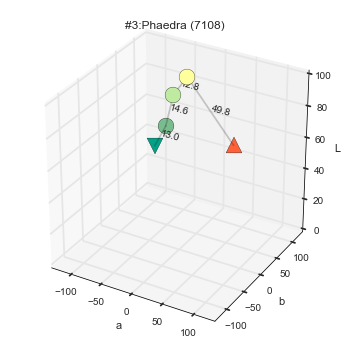

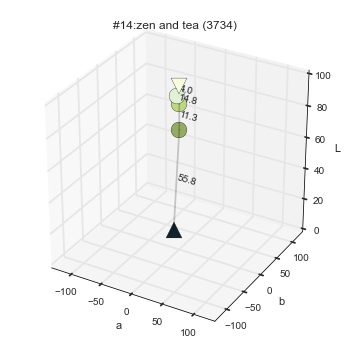

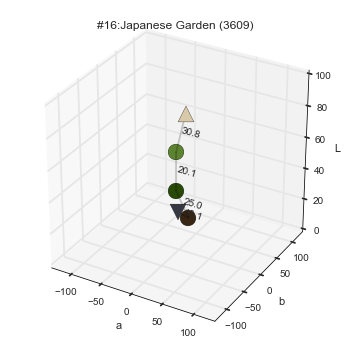

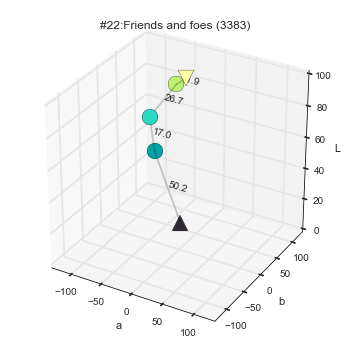

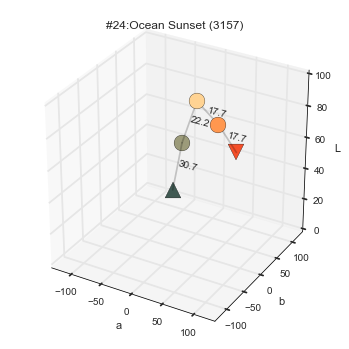

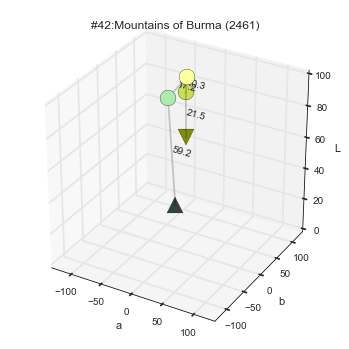

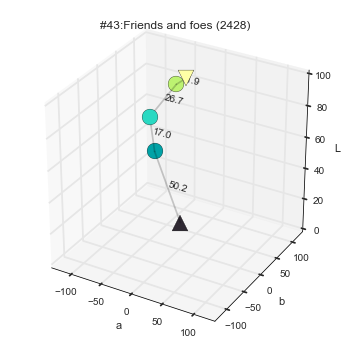

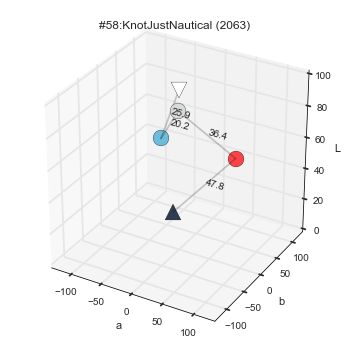

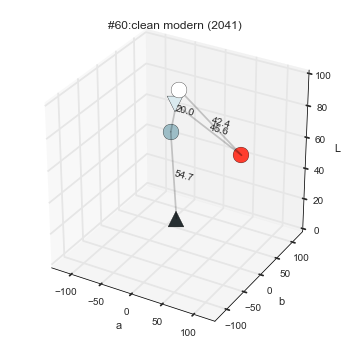

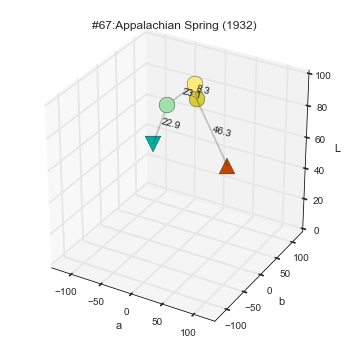

In [63]:
# printing the entire thing is too much!
plot_scheme_Kmeans(labels[:100],2)

- Some themes look similar, but not all.

###<font color='blue'>Thoughts:</font>
- Kmeans seems to work, but not completely. 
    - Tweak the parameters from Kmeans
- Input
    - The distances are not independent.
    - 3D structure is not considered.
    - Absolute color might matter
- Choosing the right K
    - silhouette score, comparing variance, information criteria
- Different clustering algorithm?

####4. Compare silhouette score

In [47]:
# This codes is from sklearn cluster page. Partially modified by Hongsup Shin
# this function has kmeans in it
# run kmeans per k and computes silhouette score
from sklearn.metrics import silhouette_samples, silhouette_score
def run_s_score(data,range_n_clusters,init='k-means++', n_init=10, max_iter=300):
    for n_clusters in range_n_clusters:
        
        # create a figure
        fig = plt.figure(figsize=(5,5))
        ax1 = fig.add_subplot(111)                 
        ax1.set_xlim([-0.2, 1]) # ax1: silhouette plot (values range from -1, 1)

        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters
        ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])

        # run kmeans
        clusterer = cluster.KMeans(n_clusters=n_clusters,init=init,n_init=n_init,max_iter=max_iter)
        cluster_labels = clusterer.fit_predict(data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(data, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = pltcm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhoutte score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

        plt.show()

('For n_clusters =', 4, 'The average silhouette_score is :', 0.15904433515105701)


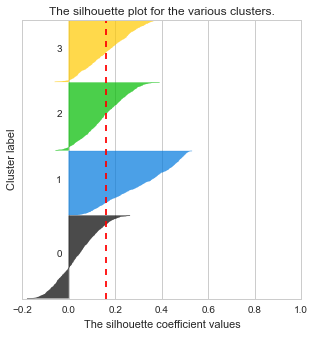

('For n_clusters =', 5, 'The average silhouette_score is :', 0.17263441764587956)


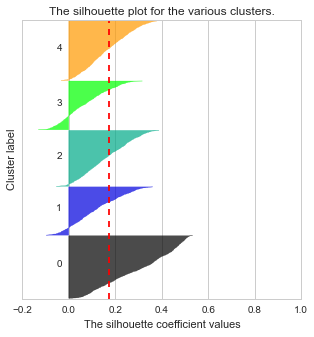

('For n_clusters =', 6, 'The average silhouette_score is :', 0.15344463998312499)


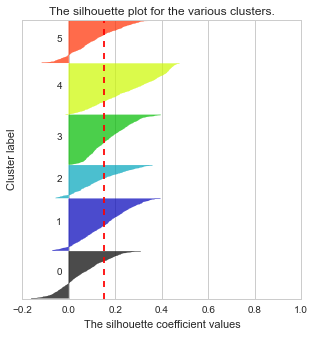

('For n_clusters =', 7, 'The average silhouette_score is :', 0.15060503233408598)


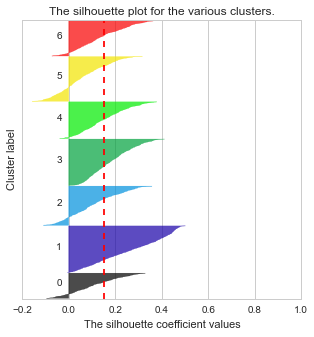

('For n_clusters =', 8, 'The average silhouette_score is :', 0.15674714214588753)


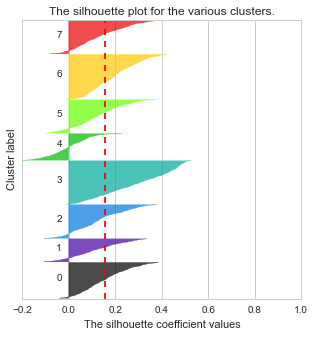

('For n_clusters =', 9, 'The average silhouette_score is :', 0.14917537425698016)


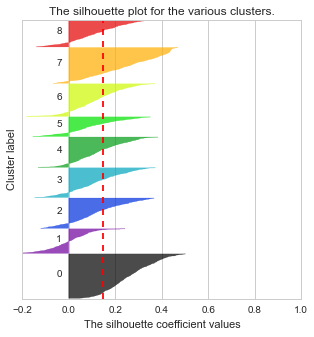

('For n_clusters =', 10, 'The average silhouette_score is :', 0.14756775958302076)


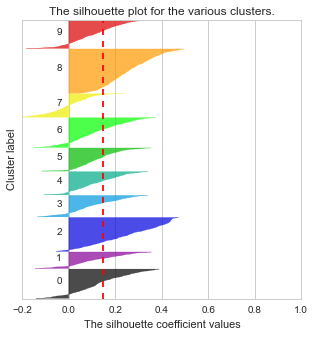

In [48]:
# compute silhouette score for k=4, ... , n_clusters (10)
run_s_score(data_pair,range(4,n_clusters+1))

- There are clusters that have many samples with negative silhouette score. 
- Also, the score is in general low.
- Possible reasons
    - Not a good feature
    - k can be larger than the current k (=10)
- Issues
    - Visual method: difficult to quantify
- Possible solution
    - Use information criteria

###Attempt 2.1 : Adding a starting point coordinates (L, a, b) to the distance vector

####1. Compute the vectors

In [49]:
dist_pair_Lab1_list = []
for i in range(len(df_)):
    x = dist_pair(i)
    x.append(df_.L1[i])
    x.append(df_.a1[i])
    x.append(df_.b1[i])
    # add starting point vector
    dist_pair_Lab1_list.append(x)
data_pair_Lab1 = np.array(dist_pair_Lab1_list)

####2. Kmeans

In [64]:
k = 10
labels, centroids, kmeans = run_Kmeans(data_pair_Lab1,k)

####3. Visualize

(array([ 5, 12, 13, 19, 26, 30, 31, 47, 49, 59, 75]),)
1


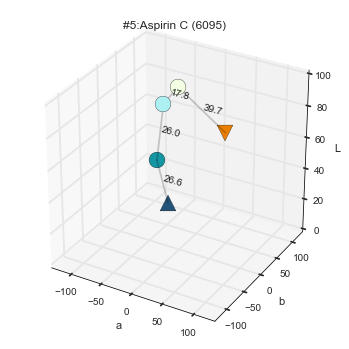

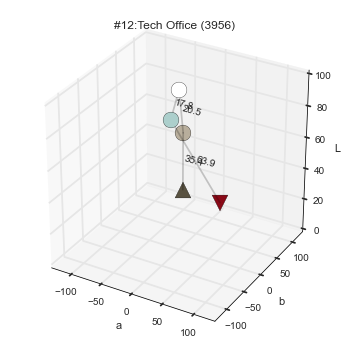

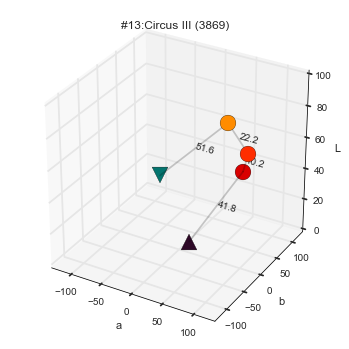

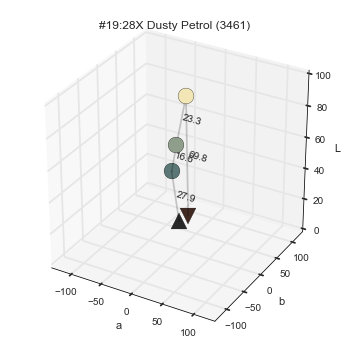

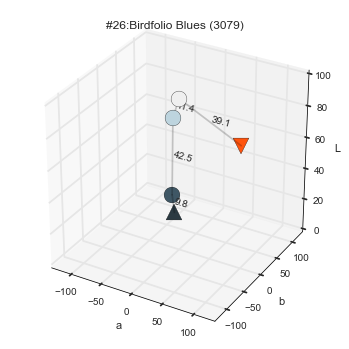

...

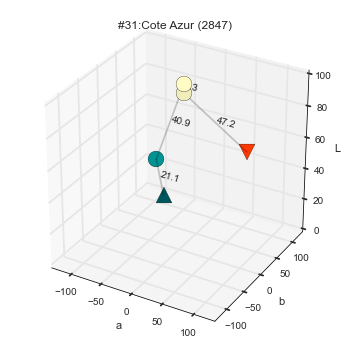

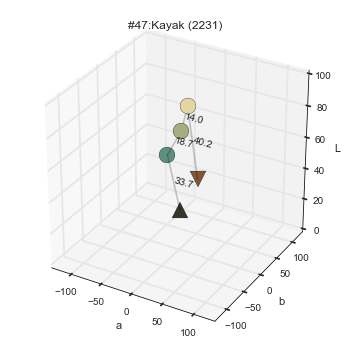

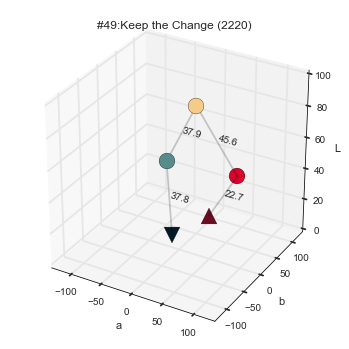

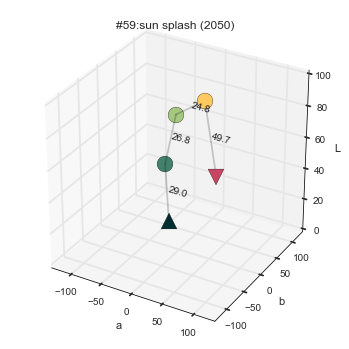

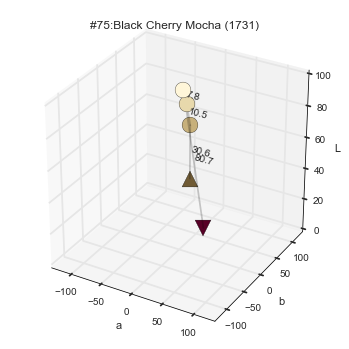

In [65]:
# visualize the cluster #2 from the first 100 themes
plot_scheme_Kmeans(labels[:100],2)

- Still the clustering result is not great. Some look similar but the structure varies much.

####4. Compute silhouette score

('For n_clusters =', 4, 'The average silhouette_score is :', 0.17839095552349149)


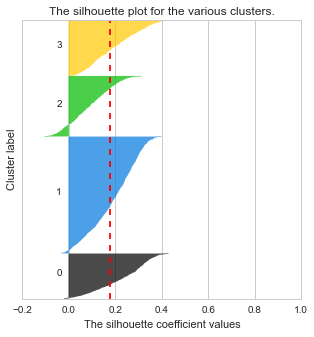

('For n_clusters =', 5, 'The average silhouette_score is :', 0.15239960149978593)


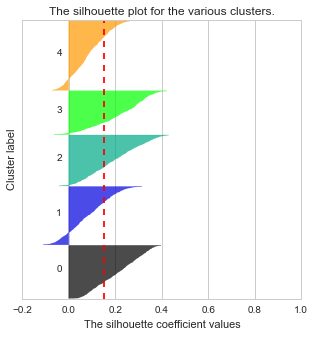

('For n_clusters =', 6, 'The average silhouette_score is :', 0.15203766679624456)


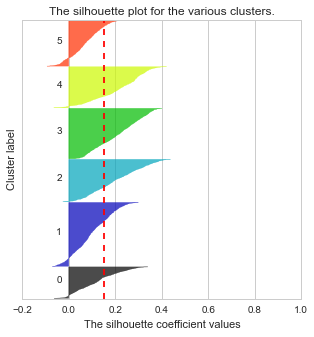

('For n_clusters =', 7, 'The average silhouette_score is :', 0.1324455260031023)


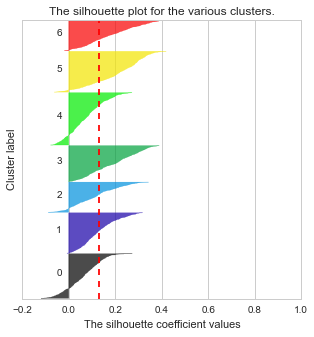

('For n_clusters =', 8, 'The average silhouette_score is :', 0.13364595492112399)


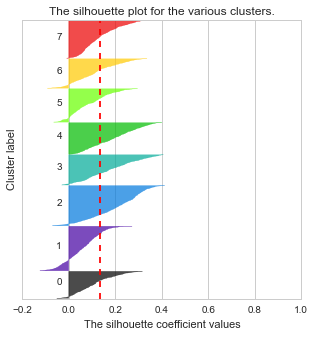

('For n_clusters =', 9, 'The average silhouette_score is :', 0.14226783064413845)


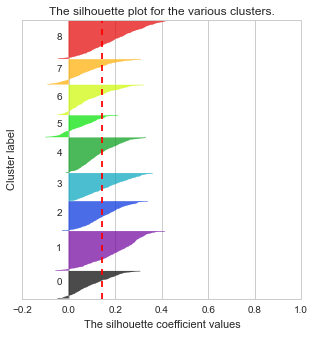

('For n_clusters =', 10, 'The average silhouette_score is :', 0.13522416668649181)


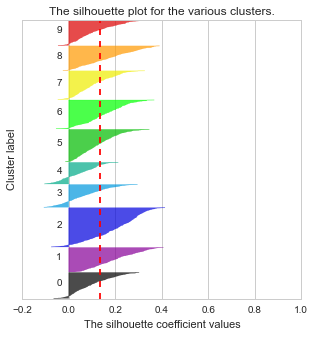

In [52]:
run_s_score(data_pair_Lab1,range(4,n_clusters+1))

- Better than Attemp 2 (distance vector)

###Attempt 3: Use Lab coordinates (15D vector)

####1. Create the coordinate vector

In [53]:
LabAll_list = []
for i in range(len(df_)):
    b = [df_.L1[i],df_.a1[i],df_.b1[i],df_.L2[i],df_.a2[i],df_.b2[i],df_.L3[i],df_.a3[i],df_.b3[i],df_.L4[i],df_.a4[i],df_.b4[i],df_.L5[i],df_.a5[i],df_.b5[i]]
    LabAll_list.append(b)
data_LabAll = np.array(LabAll_list)

####2. Run kmeans

- Since now we consider absolute colors, the number of clusters is likely larger than the previous attempts.

In [66]:
n_clusters = 20
labels_LabAll, centroids_LabAll, kmeans_LabAll = run_Kmeans(data_LabAll,n_clusters)

####3.1 Visualize each theme from a cluster (clusterIdx = 1)

(array([ 1,  4, 11, 35, 64, 76, 95]),)
1


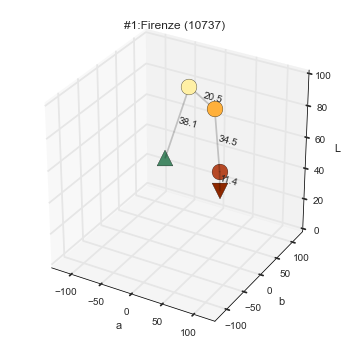

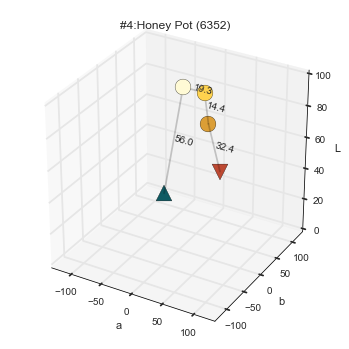

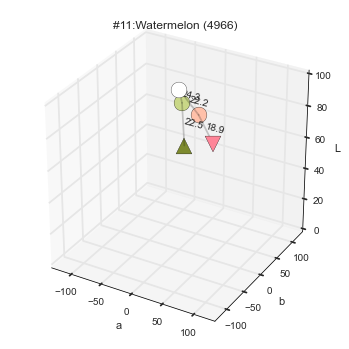

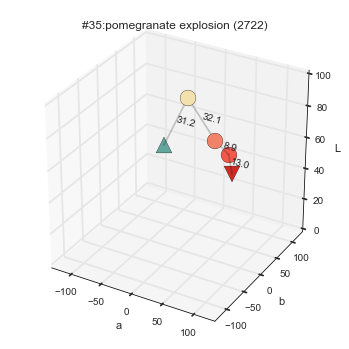

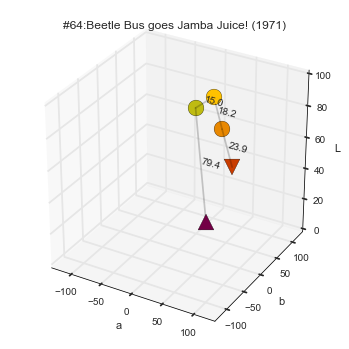

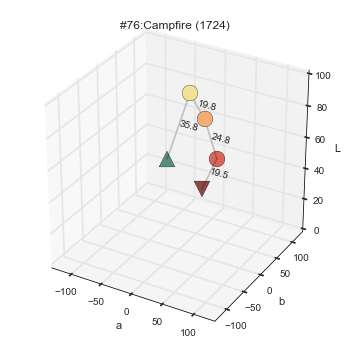

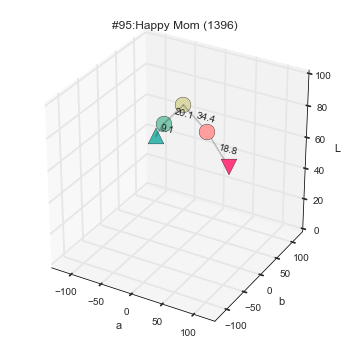

In [67]:
plot_scheme_Kmeans(labels_LabAll[:100],1)

####3.2 Visualize all themes from a cluster algother
- We con collapse nth color in all themes per cluster

In [56]:
# function that plots nth color (colorIdx) in mth theme (schemeIdx)
def plot_color_in_scheme(ax,colorIdx,schemeIdx,index1=0,index2=0):
    # viewpoint
    if index1 == 'a' and index2 == 'b':
        el = 90
        az = -90
    elif index1 == 'L' and index2 == 'a':
        el = 0
        az = 90
    elif index1 == 'L' and index2 == 'b':
        el = 0
        az = 180
    elif int(index1) == 0 and int(index2) == 0:
        el = None
        az = None
        
        # 1. conver Lab color to sRGB for assigning colors for the plot
        LabColor_cm = df_['Lab'+str(colorIdx)][schemeIdx]
        sRGBColor_cm = convert_color(LabColor_cm,sRGBColor)

        # 2. convert this value to list for plotting
        sRGBColor_list = col_tuple2list(sRGBColor_cm)
        r = min(sRGBColor_list[0],1)
        g = min(sRGBColor_list[1],1)
        b = min(sRGBColor_list[2],1)
        color = np.array([[r,g,b],[0,0,0]])

        # 3. load the Lab coordinates
        L = df_['L'+str(colorIdx)][schemeIdx]
        a = df_['a'+str(colorIdx)][schemeIdx]
        b = df_['b'+str(colorIdx)][schemeIdx]        

        # 4. draw each color (first: triangle, last: reversed triangle, in-betweens: circle)
        ax.scatter(a,b,L,c=color,s=250,marker='o')
            
    # view angle
    ax.view_init(elev=el,azim=az)

    ax.set_xlabel('a')
    ax.set_ylabel('b')
    ax.set_zlabel('L')
    ax.set_xlim3d(-128, 128)
    ax.set_ylim3d(-128, 128)
    ax.set_zlim3d(0, 100)

In [57]:
# This function collapses all themes belong to a cluster (clusterIdx).
# Then, draw 5 plots, each of which corresponds to nth color in the themes
# Ex. The 1st plot is all the 1st colors from the themes with a cluster (clusterIdx)
def plot_Kmeans_collapsed(labels,clusterIdx,figsize=10):
    # load indices
    indices = np.where(labels==clusterIdx)
    #print indices # print the schemeIdx's of this cluster

    # plotting
    len_x = figsize*1
    len_y = figsize*5
    fig = plt.figure(figsize=(len_y,len_x))    
    
    for k in range(5):
        colorIdx = k+1
        ax = fig.add_subplot(1,5,k+1,projection='3d')
        for j in range(len(indices[0])):
            schemeIdx = indices[0][j]
            plot_color_in_scheme(ax,colorIdx,schemeIdx)

####3.3 Compare this with the individual plot (3.1)
- The figure below is the same as above (clusterIdx = 1)

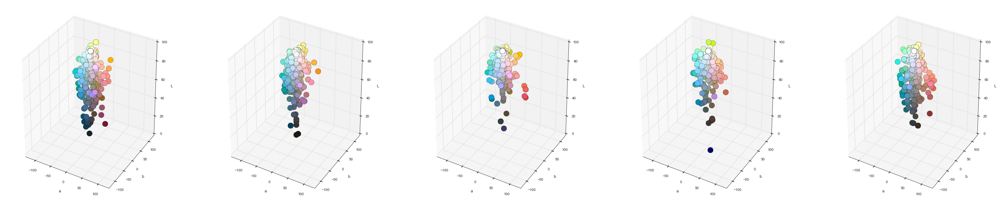

In [58]:
plot_Kmeans_collapsed(labels_LabAll,1)   

####3.4 Visualize all clusters in this way

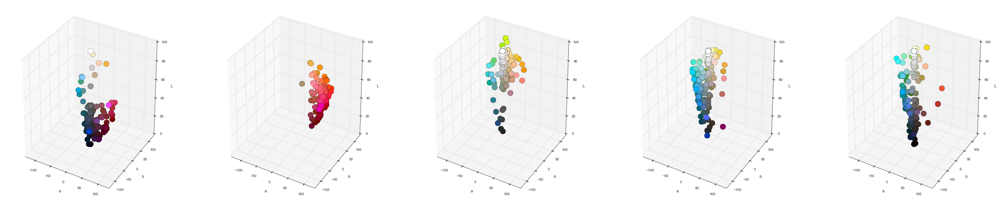

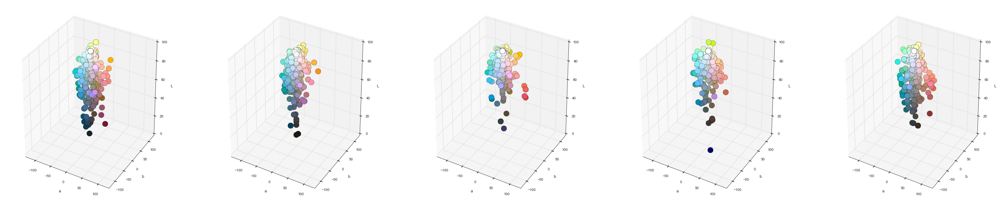

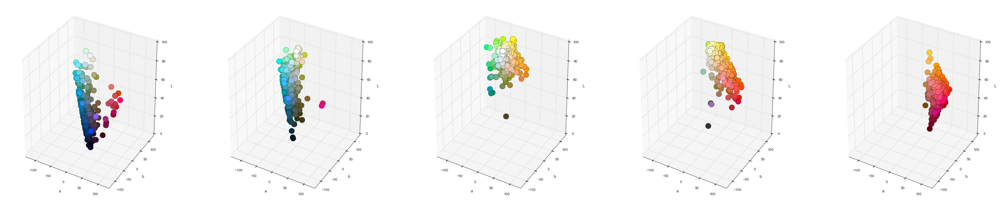

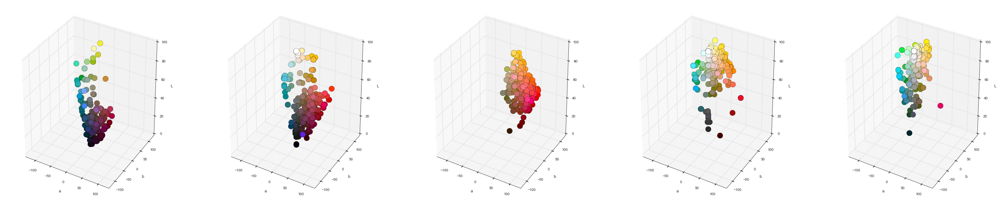

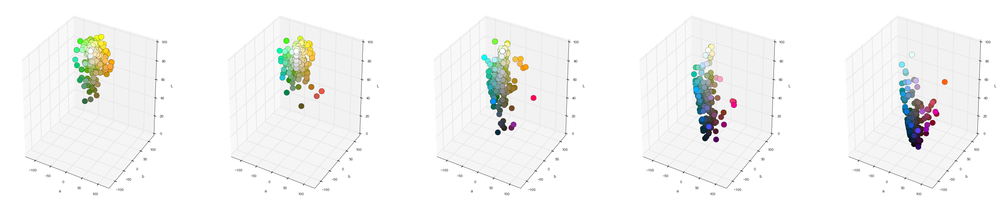

...

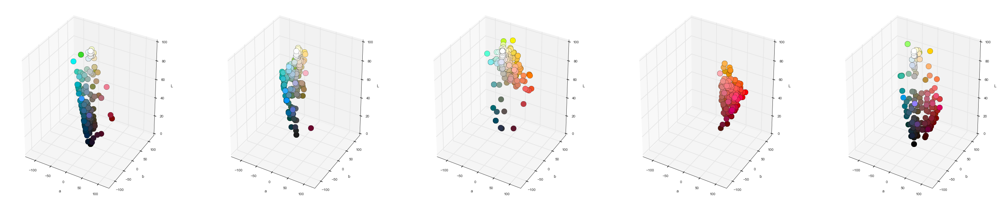

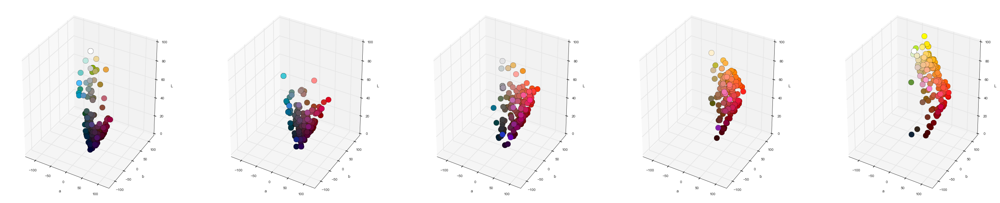

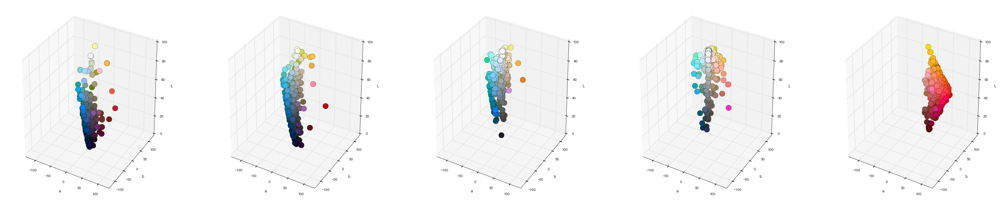

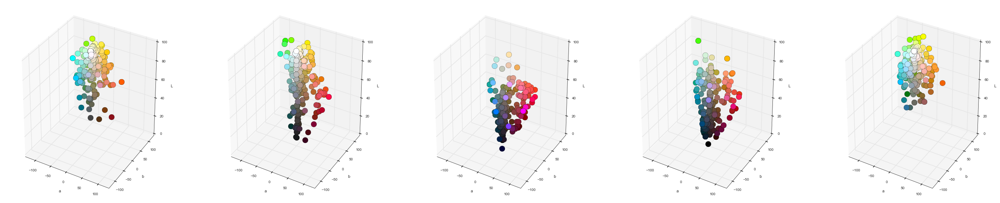

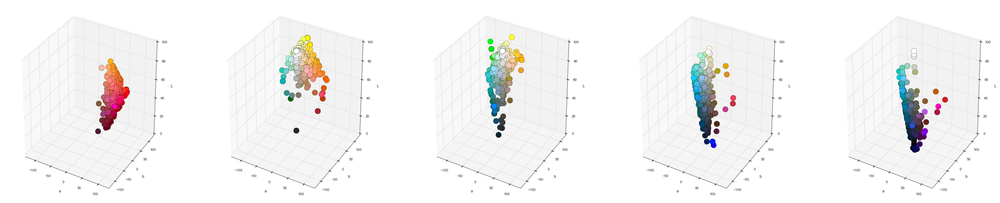

In [59]:
for i in range(n_clusters):
    plot_Kmeans_collapsed(labels_LabAll,i)

####4. Silhouette score

('For n_clusters =', 4, 'The average silhouette_score is :', 0.17864569493796092)


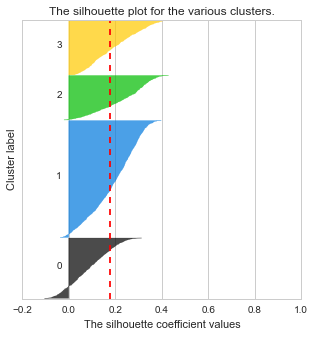

('For n_clusters =', 5, 'The average silhouette_score is :', 0.15241869951057782)


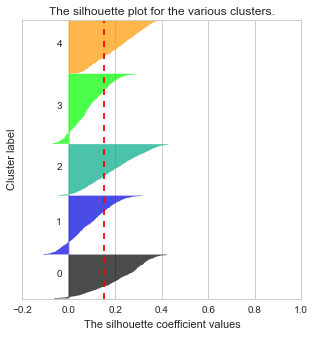

('For n_clusters =', 6, 'The average silhouette_score is :', 0.15198155868114857)


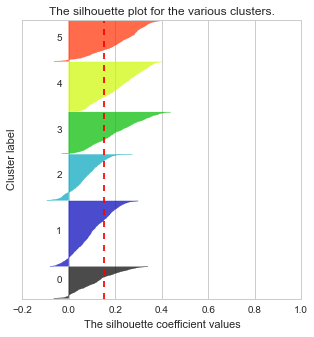

('For n_clusters =', 7, 'The average silhouette_score is :', 0.13812287213562296)


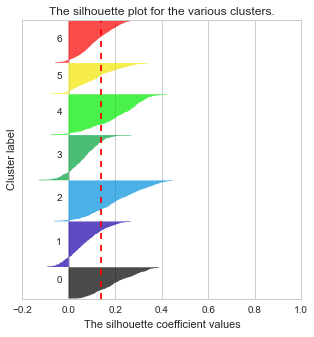

('For n_clusters =', 8, 'The average silhouette_score is :', 0.13458373944596363)


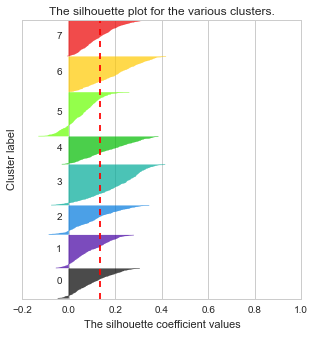

('For n_clusters =', 9, 'The average silhouette_score is :', 0.13364690311755287)


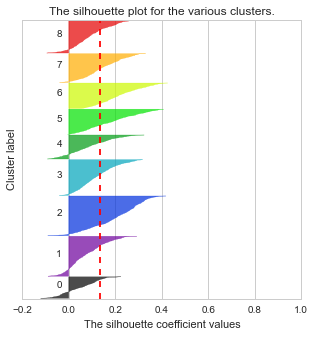

('For n_clusters =', 10, 'The average silhouette_score is :', 0.13510135244422844)


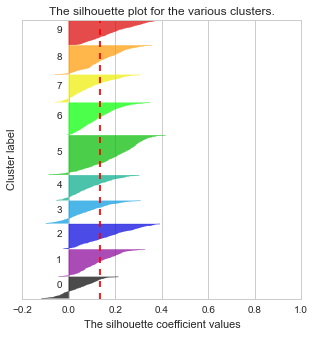

('For n_clusters =', 11, 'The average silhouette_score is :', 0.12217455685891934)


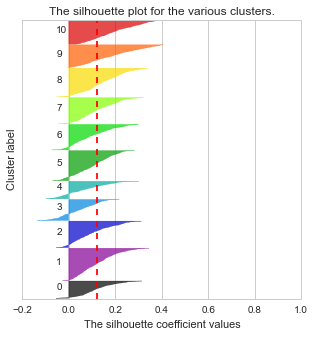

('For n_clusters =', 12, 'The average silhouette_score is :', 0.11994635669596002)


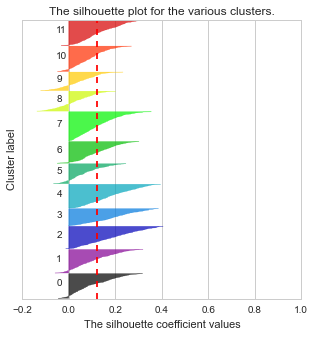

('For n_clusters =', 13, 'The average silhouette_score is :', 0.12009688962753559)


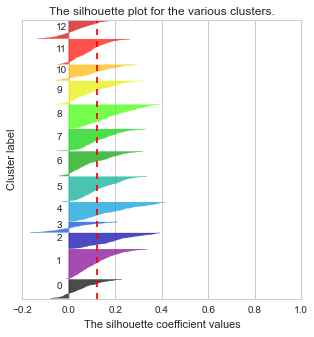

('For n_clusters =', 14, 'The average silhouette_score is :', 0.11654129638689907)


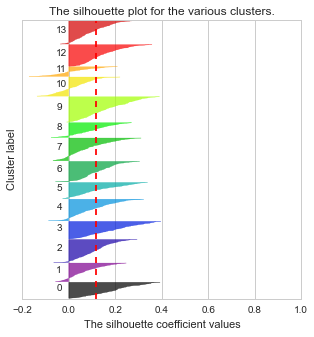

('For n_clusters =', 15, 'The average silhouette_score is :', 0.12094819546114222)


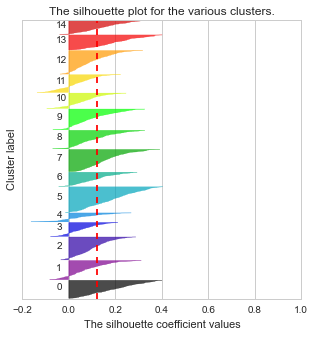

('For n_clusters =', 16, 'The average silhouette_score is :', 0.11740550142012353)


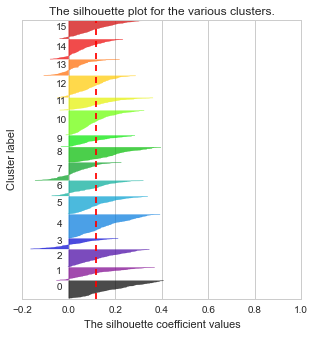

('For n_clusters =', 17, 'The average silhouette_score is :', 0.11974022402900929)


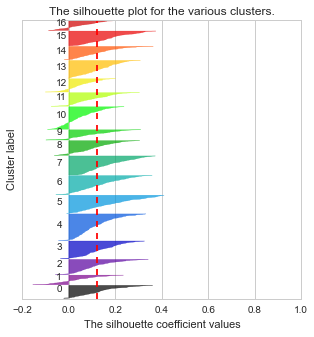

('For n_clusters =', 18, 'The average silhouette_score is :', 0.11141482047449051)


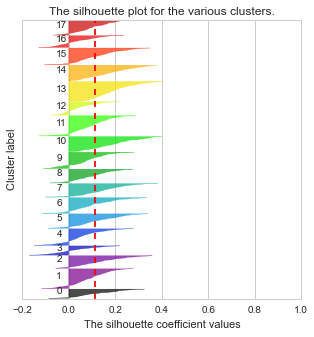

('For n_clusters =', 19, 'The average silhouette_score is :', 0.114623290834011)


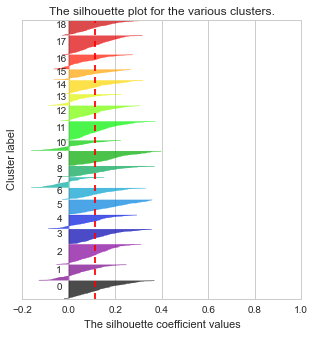

('For n_clusters =', 20, 'The average silhouette_score is :', 0.11615177689566801)


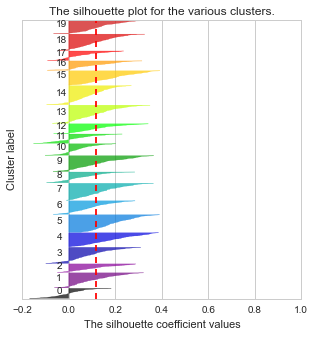

In [60]:
run_s_score(data_pair_Lab1,range(4,n_clusters+1))